# Init

In [2]:
using Pkg
Pkg.activate((@__DIR__) * "/../one_flav_env")

using LHEF
using LorentzVectorHEP
using StaticArrays
using LinearAlgebra
using LaTeXStrings
using DelimitedFiles: readdlm
using Optim
using Interpolations
using PythonPlot
using PythonCall
mpl = pyimport("matplotlib")
pe = pyimport("matplotlib.patheffects")
using NaturallyUnitful

lhe_v4(p) = LorentzVector(p.e, p.px, p.py, p.pz)

rc("font", family="serif", serif="Computer Modern", size=14)
rc("figure", autolayout=true)
rc("axes", labelsize=16, unicode_minus=false)
rc("text", usetex=true)
rc("text.latex", preamble=raw"\usepackage{slashed}")

golden_ratio = (1+sqrt(5))/2
to_cm_ns = ustrip(unnatural(u"cm*ns^-1", 1))
GeV_to_ns = ustrip(unnatural(u"ns", 1*u"GeV^-1"))
ccms = ustrip(unnatural(u"cm*s^-1", 1))

MG_RESULTS_DIR = "../madgraph/" # insert path to madgraph results directories
FIGDIR = "./"

# make sure these match what the script has output
DIR_mumu = MG_RESULTS_DIR * "mumu_to_phiphi_xsec/"
DIR_VV = MG_RESULTS_DIR * "VV_to_phiphi_xsec/"
# DIR_mumu = MG_RESULTS_DIR * "mumu_to_phiphi_2/"
# DIR_VV = MG_RESULTS_DIR * "VV_to_phiphi_2/"

XSEC_RESULTS_FILENAME = "xsec.txt"
LHE_FILENAME = "unweighted_events.lhe.gz"

function dir_runx(x)
    if x < 10
        return "Events/run_0$x/"
    else
        return "Events/run_$x/"
    end
end
;

  Activating project at `~/Dropbox (University of Oregon)/MuC/Aria/one_flav/code/one_flav_env`


In [3]:
include("../one_flav_env/boltz_solve.jl")
using .LFDM_Boltz: lifetimes

In [4]:
function bin_data(x, binedges)
    N_bins = length(binedges)-1
    res = zeros(eltype(x), N_bins)
    for i in 1:N_bins
        res[i] = count(y -> binedges[i] <= y < binedges[i+1], x)
    end
    res[end] = count(y -> binedges[end-1] <= y <= binedges[end], x)
    return res
end
;

In [5]:
gamma(lv::LorentzVector) = energy(lv)/mass(lv)
beta(lv::LorentzVector) = sqrt(1-1/gamma(lv)^2)

function find_phis(event)
    idxs = Vector{Int64}()
    for p in event.particles[3:end]
        if p.id in [9000006, -9000006]
            append!(idxs, p.idx)
        end
    end
    return idxs
end

function phi_summarize(event::LHEF.Event)
    phi_idx = find_phis(event)

    p1 = lhe_v4(event.particles[phi_idx[1]])
    p2 = lhe_v4(event.particles[phi_idx[2]])

    gammas = gamma.([p1,p2])
    betas = beta.([p1,p2])
    betagamma = betas .* gammas

    etas = eta.([p1,p2])
    
    return Matrix(reduce(hcat, [betas, betagamma, etas])')
end

function phi_summarize(lhe::Vector{LHEF.Event})
    N_events = length(lhe)

    res = zeros(Float64, (3, 2*N_events))

    for i in 1:N_events
        s = phi_summarize(lhe[i])
        res[:,2*i-1] = s[:,1]
        res[:,2*i] = s[:,2]
    end

    return res
end
;

In [6]:
function get_rts(rundir)
    n_run = rundir[end-2:end-1]
    if n_run == "00"
        n_run = rundir[end-3:end-1]
    end
    f = open(rundir * "run_$(n_run)_tag_1_banner.txt")
    l = ""
    for line in eachline(f)
        if occursin("ebeam1",line)
            l *= line
            break
        end
    end
    close(f)
    return 2*parse(Float64, strip(split(l,"\t")[1]))
end

function get_mphi(rundir)
    if isfile(rundir * "params.dat")
        f = open(rundir * "params.dat")
        l = ""
        for line in eachline(f)
            if occursin("msca",line)
                l *= line
                break
            end
        end
        close(f)
        return parse(Float64, strip(split(l,"=")[2]))
    else
        return 0.0
    end
end

get_events(rundir) = parse_lhe(rundir * LHE_FILENAME)

function get_xsec(rundir)
    n_run = rundir[end-2:end-1]
    
    if n_run == "00"
        n_run = rundir[end-3:end-1]
        xsec_fname = rundir[1:end-15] * XSEC_RESULTS_FILENAME
    else
        xsec_fname = rundir[1:end-14] * XSEC_RESULTS_FILENAME
    end
    
    n_run = parse(Int64, n_run)
    return readdlm(xsec_fname, skipstart=1)[n_run,3]
end
;

In [7]:
function count_runs(mg_proc_dir)
    n_run = 0
    for ff in readdir(mg_proc_dir * "Events/")
        if isdir(mg_proc_dir * "Events/" * ff)
            n_run += 1
        end
    end
    return n_run
end

function get_all(fn, mg_proc_dir)
    n_run = count_runs(mg_proc_dir)

    placehold = Vector{Any}()

    for i in 1:n_run
        rundir = dir_runx(i)
        push!(placehold, fn(mg_proc_dir * rundir))
    end

    results = Vector{typeof(placehold[1])}(placehold)

    return results
end

function get_runs_at_rts(rts_tev; dirs=(DIR_mumu, DIR_VV))

    rts_gev = Float64(rts_tev)*1e3

    rts_vectors = get_all.(get_rts, dirs)
    rts_idxs = findall.(x -> x == rts_gev, rts_vectors)

    rundirs = [dirs[i] .* dir_runx.(rts_idxs[i]) for i in 1:length(dirs)]

    all_xsecs = get_all.(get_xsec, dirs)
    xsecs = [all_xsecs[i][rts_idxs[i]] for i in 1:length(dirs)]

    mumu_xsecs = xsecs[1]
    VV_xsecs = xsecs[2]

    mumu_rundirs = rundirs[1]
    VV_rundirs = rundirs[2]

    N_runs_mumu = length(mumu_rundirs)
    N_runs_VV = length(VV_rundirs)

    mphis_mumu = zeros(Float64, N_runs_mumu)
    mphis_VV = zeros(Float64, N_runs_VV)
    mumu_summaries = zeros(Float64, (N_runs_mumu, 3, 200000))
    VV_summaries = zeros(Float64, (N_runs_VV, 3, 200000))

    @Threads.threads for j in 1:length(mumu_rundirs)
        mphis_mumu[j] = get_mphi(mumu_rundirs[j])
        events = get_events(mumu_rundirs[j])
        mumu_summaries[j,:,:] = phi_summarize(events)
        events = nothing
    end

    @Threads.threads for j in 1:length(VV_rundirs)
        mphis_VV[j] = get_mphi(VV_rundirs[j])
        events = get_events(VV_rundirs[j])
        VV_summaries[j,:,:] = phi_summarize(events)
        events = nothing
    end
    
    if mphis_mumu == mphis_VV
        return (rts=rts_gev, mphis=mphis_mumu, mumu_xsecs=mumu_xsecs,
                vv_xsecs=VV_xsecs, mumu_summaries=mumu_summaries,
                vv_summaries=VV_summaries)
    else
        throw(ArgumentError("mphis don't match!"))
    end
end

function get_run_at_mphi(rts_runs, mphi_tev)
    mphi_gev = mphi_tev*1e3

    idx = 0

    for (i,m) in enumerate(rts_runs.mphis)
        if m ≈ mphi_gev
            idx = i
        end
    end

    return (rts=rts_runs.rts, mphi=rts_runs.mphis[idx],
    mumu_summary=rts_runs.mumu_summaries[idx,:,:],
    mumu_xsec=rts_runs.mumu_xsecs[idx], 
    vv_summary=rts_runs.vv_summaries[idx,:,:], vv_xsec=rts_runs.vv_xsecs[idx])
end
;

In [8]:
rts10_runs = get_runs_at_rts(10);
rts3_runs = get_runs_at_rts(3);

In [15]:
rts3_mphis = [.5, 1.0, 1.3];
rts10_mphis = [.5, 1.0, 4.5];

# 1D Histograms

In [42]:
function make_histograms(rts_runs, mphis_tev; nbins=[50, 50])
    N_mphis = length(mphis_tev)

    title = L"$i \to \phi^+ \phi^-$ ($\sqrt{s} = %$(1e-3*rts_runs.rts)$ TeV)"
    labels = Vector{String}()

    for m in mphis_tev
        push!(labels, L"$m_\phi = %$(round(m,digits=1))$ TeV")
    end

    mphi_runs = get_run_at_mphi.((rts_runs,), mphis_tev)

    xlabels = [L"\beta \gamma", L"\eta"]
    colors = ["tab:blue", "tab:orange", "tab:red"]
    linestyles = ["solid", "dashed"]

    fig, axs = subplots(1, 2, figsize=(golden_ratio*5, 5))

    for (i, a) in enumerate(axs)
        eachmin = [minimum(mphi_runs[j].mumu_summary[i+1,:]) for j in 1:N_mphis]
        eachmin2 = [minimum(mphi_runs[j].vv_summary[i+1,:]) for j in 1:N_mphis]
        binmin = min(eachmin..., eachmin2...)

        eachmax = [maximum(mphi_runs[j].mumu_summary[i+1,:]) for j in 1:N_mphis]
        eachmax2 = [maximum(mphi_runs[j].vv_summary[i+1,:]) for j in 1:N_mphis]
        binmax = max(eachmax..., eachmax2...)

        binns = range(binmin, binmax, nbins[i])

        for j in 1:N_mphis
            a.hist(mphi_runs[j].mumu_summary[i+1,:], bins=binns, color=colors[j],
                linestyle=linestyles[1], histtype="step")#, density=true)
            a.hist(mphi_runs[j].vv_summary[i+1,:], bins=binns, color=colors[j],
                linestyle=linestyles[2], histtype="step")#, density=true)
        end

        a.set_yscale("log")

        a.set_xlabel(xlabels[i])
        a.set_ylabel("\\# of Events")

        a.grid(alpha=0.3)

        a.set_xlim((binmin, binmax))
    end

    for i in 1:N_mphis
        axs[0].plot(0, Inf, lw=1., c=colors[i], label=labels[i])
    end
    axs[0].plot(0, Inf, lw=1., c="black", label=L"i = \mu^+ \mu^-")
    axs[0].plot(0, Inf, lw=1., c="black", ls="dashed", label=L"$i = $VBF")

    handles, labels = axs[0].get_legend_handles_labels()

    fig.legend(handles, labels, loc="lower center", ncol=3, fontsize=12)

    fig.suptitle(title)

    tight_layout(rect=(0, .1, 1, 1.05))

    plotclose()
    return fig
end

function make_histograms_xsec(rts_runs, mphis_tev, lumi; nbins=[50, 50, 50])
    N_mphis = length(mphis_tev)
    N_events = 200000

    title = L"$\mu^+ \mu^- \to \phi^+ \phi^-$ ($\sqrt{s} = %$(1e-3*rts_runs.rts)$ TeV, $\mathcal{L} = %$(lumi*1e-6)$ ab$^{-1}$)"
    labels = Vector{String}()

    for m in mphis_tev
        push!(labels, L"$m_\phi = %$(round(m,digits=1))$ TeV")
    end

    mphi_runs = get_run_at_mphi.((rts_runs,), mphis_tev)

    xlabels = [L"\beta \gamma", L"\eta", L"$L/\tau_{\phi}$ [cm/ns]"]
    colors = ["tab:blue", "tab:orange", "tab:red"]
    linestyles = ["solid", "dashed"]

    fig, axs = subplots(3, 1, figsize=(5, 10))

    eachmax_βγ = [maximum(mphi_runs[j].mumu_summary[2,:]) for j in 1:N_mphis]
    eachmax2_βγ = [maximum(mphi_runs[j].vv_summary[2,:]) for j in 1:N_mphis]
    binmax_βγ = max(eachmax_βγ..., eachmax2_βγ...)
    βγ_bins = range(0, binmax_βγ, nbins[1])

    eachmax_η = [maximum(abs.(mphi_runs[j].mumu_summary[3,:])) for j in 1:N_mphis]
    eachmax2_η = [maximum(abs.(mphi_runs[j].vv_summary[3,:])) for j in 1:N_mphis]
    binmax_η = max(eachmax_η..., eachmax2_η...)
    η_bins = range(-binmax_η, binmax_η, nbins[2])

    mumu_Lτ = [mphi_runs[j].mumu_summary[2,:] ./ 
                cosh.(mphi_runs[j].mumu_summary[3,:]) for j in 1:N_mphis]
    vv_Lτ = [mphi_runs[j].vv_summary[2,:] ./ 
            cosh.(mphi_runs[j].vv_summary[3,:]) for j in 1:N_mphis]
    
    eachmax_Lτ = [maximum(mumu_Lτ[j]) for j in 1:N_mphis]
    eachmax2_Lτ = [maximum(vv_Lτ[j]) for j in 1:N_mphis]
    binmax_Lτ = max(eachmax_Lτ..., eachmax2_Lτ...)
    Lτ_bins = range(0, binmax_Lτ, nbins[3])

    binns = [βγ_bins, η_bins, Lτ_bins]
    binns_scaled = [βγ_bins, η_bins, ustrip.(unnatural.(u"cm*ns^-1", Lτ_bins))]

    xmins = [0, -binmax_η, 0]
    xmaxs = [binmax_βγ, binmax_η, ustrip(unnatural(u"cm*ns^-1", binmax_Lτ))]

    mumu_stuff = [[mphi_runs[j].mumu_summary[2,:], 
                  mphi_runs[j].mumu_summary[3,:], mumu_Lτ[j]]
                  for j in 1:N_mphis]
    vv_stuff = [[mphi_runs[j].vv_summary[2,:], 
                mphi_runs[j].vv_summary[3,:], vv_Lτ[j]] for j in 1:N_mphis]

    for (i, a) in enumerate(axs)
        minN = zeros(Float64, N_mphis)
        maxN = zeros(Float64, N_mphis)

        for j in 1:N_mphis
            mumu_binned = bin_data(mumu_stuff[j][i], binns[i])
            mumu_scaled = @. mphi_runs[j].mumu_xsec*lumi*mumu_binned / N_events

            vv_binned = bin_data(vv_stuff[j][i], binns[i])
            vv_scaled = @. mphi_runs[j].vv_xsec*lumi*vv_binned / N_events

            N_expected = mumu_scaled .+ vv_scaled

            minN[j] = minimum(N_expected[N_expected .> 0])
            maxN[j] = maximum(N_expected)

            @. N_expected = N_expected + (N_expected == 0)*1e-50

            a.stairs(log10.(N_expected), edges=binns_scaled[i], 
                color=colors[j], linestyle=linestyles[1])
        end

        ylim_min = floor(log10(minimum(minN)))
        ylim_max = ceil(log10(maximum(maxN)))

        # a.set_yscale("log")

        a.set_xlabel(xlabels[i])
        a.set_ylabel("\\# of Expected Events")

        a.grid(alpha=0.3)

        a.set_xlim((xmins[i], xmaxs[i]))
        a.set_ylim((ylim_min, ylim_max))

        x_extent = xmaxs[i]-xmins[i]
        y_extent = ylim_max - ylim_min

        if y_extent <= 5
            yticks = ylim_min:ylim_max
        else
            yticks = ylim_min:2:ylim_max
        end
        yticklabels = [L"10^{%$(round(Int,x))}" for x in yticks]
        a.set_yticks(yticks, yticklabels)

        a.set_aspect(x_extent / (y_extent*golden_ratio), adjustable="box")
        
    end

    for i in 1:N_mphis
        axs[0].plot(0, Inf, lw=1., c=colors[i], label=labels[i])
    end

    handles, labels = axs[0].get_legend_handles_labels()

    fig.legend(handles, labels, loc="lower center", ncol=3, fontsize=12)

    fig.suptitle(title)

    tight_layout(rect=(0, 0.02, 1, 1.01))

    plotclose()
    return fig
end

function make_histograms_xsec_2(rts_runs_vec, mphis_tev_vec, lumis; binsize=[0.2, 0.5, ustrip(natural(6.0*u"cm*ns^-1"))])
    N_mphis = length.(mphis_tev_vec)
    N_events = 200000

    # title = L"$\mu^+ \mu^- \to \phi^+ \phi^-$ ($\sqrt{s} = %$(1e-3*rts_runs.rts)$ TeV, $\mathcal{L} = %$(lumi*1e-6)$ ab$^{-1}$)"
    
    labels = Vector{String}()
    for m in unique(vcat(mphis_tev_vec...))
    # for m in mphis_tev_vec[2]
        push!(labels, L"$m_\phi = %$(round(m,sigdigits=4))$ TeV")
    end

    mphi_runs = [get_run_at_mphi.((rts_runs_vec[i],), mphis_tev_vec[i]) for i in 1:2]

    xlabels = [L"\beta \gamma", L"\eta", L"$L/\tau_{\phi}$ [cm/ns]"]
    colors = ["tab:blue", "tab:orange", "tab:red", "tab:cyan"]
    colorms = [["tab:blue", "tab:orange", "tab:red"], ["tab:blue", "tab:orange", "tab:cyan"]]
    linestyles = ["solid", "dashed"]

    fig, axs = subplots(2, 2, figsize=(9, 6))
    # fig, axs = subplots(2, 1, figsize=(6, 8))
    # fig, axs = subplots(1, 2, figsize=(10, 5))
    # fig = figure(figsize=(6, 4))
    # a = gca()

    eachmax_βγ = [[maximum(mphi_runs[i][j].mumu_summary[2,:]) for j in 1:N_mphis[i]] for i in 1:2]
    eachmax2_βγ = [[maximum(mphi_runs[i][j].vv_summary[2,:]) for j in 1:N_mphis[i]] for i in 1:2]
    binmax_βγ = [max(eachmax_βγ[i]..., eachmax2_βγ[i]...) for i in 1:2]
    βγ_bins = [range(0, ceil(binmax_βγ[i]/binsize[1])*binsize[1]; step=binsize[1]) for i in 1:2]

    # eachmax_η = [[maximum(abs.(mphi_runs[i][j].mumu_summary[3,:])) for j in 1:N_mphis[i]] for i in 1:2]
    # eachmax2_η = [[maximum(abs.(mphi_runs[i][j].vv_summary[3,:])) for j in 1:N_mphis[i]] for i in 1:2]
    # binmax_η = [max(eachmax_η[i]..., eachmax2_η[i]...) for i in 1:2]
    η_bins = [range(-7.5, 7.5; step=binsize[2]) for i in 1:2]

    mumu_Lτ = [[mphi_runs[i][j].mumu_summary[2,:] ./ 
                cosh.(mphi_runs[i][j].mumu_summary[3,:]) for j in 1:N_mphis[i]]
                for i in 1:2]
    vv_Lτ = [[mphi_runs[i][j].vv_summary[2,:] ./ 
            cosh.(mphi_runs[i][j].vv_summary[3,:]) for j in 1:N_mphis[i]]
            for i in 1:2]
    
    eachmax_Lτ = [[maximum(mumu_Lτ[i][j]) for j in 1:N_mphis[i]] for i in 1:2]
    eachmax2_Lτ = [[maximum(vv_Lτ[i][j]) for j in 1:N_mphis[i]] for i in 1:2]
    binmax_Lτ = [max(eachmax_Lτ[i]..., eachmax2_Lτ[i]...) for i in 1:2]
    Lτ_bins = [range(0, ceil(binmax_Lτ[i]/binsize[3])*binsize[3]; step=binsize[3]) for i in 1:2]

    binns = [[βγ_bins[i], η_bins[i], Lτ_bins[i]] for i in 1:2]
    binns_scaled = [[βγ_bins[i], η_bins[i], 
                    ustrip.(unnatural.(u"cm*ns^-1", Lτ_bins[i]))] for i in 1:2]

    xmins = [[0, -7.5, 0] for i in 1:2]
    xmaxs = [[βγ_bins[i][end], 7.5, 
                ustrip(unnatural(u"cm*ns^-1", Lτ_bins[i][end]))] for i in 1:2]

    mumu_stuff = [[[mphi_runs[i][j].mumu_summary[2,:], 
                  mphi_runs[i][j].mumu_summary[3,:], mumu_Lτ[i][j]]
                  for j in 1:N_mphis[i]] for i in 1:2]
    vv_stuff = [[[mphi_runs[i][j].vv_summary[2,:], 
                mphi_runs[i][j].vv_summary[3,:], vv_Lτ[i][j]] for j in 1:N_mphis[i]]
                for i in 1:2]

    # i=3
    # k=2
    for (i, ax) in enumerate(axs)
    # for (i, a) in enumerate(axs)
        for (k, a) in enumerate(ax)
            minN = zeros(Float64, N_mphis[k])
            maxN = zeros(Float64, N_mphis[k])

            for j in 1:N_mphis[k]
                mumu_binned = bin_data(mumu_stuff[k][j][i], binns[k][i])
                mumu_scaled = @. mphi_runs[k][j].mumu_xsec*lumis[k]*mumu_binned / N_events

                vv_binned = bin_data(vv_stuff[k][j][i], binns[k][i])
                vv_scaled = @. mphi_runs[k][j].vv_xsec*lumis[k]*vv_binned / N_events

                N_expected = mumu_scaled .+ vv_scaled

                minN[j] = minimum(N_expected[N_expected .> 0])
                maxN[j] = maximum(N_expected)

                @. N_expected = N_expected + (N_expected == 0)*1e-50

                a.stairs(log10.(N_expected), edges=binns_scaled[k][i], 
                    color=colorms[k][j], linestyle=linestyles[1])
            end

            ylim_min = floor(log10(minimum(minN)))
            ylim_max = ceil(log10(maximum(maxN)))

            # a.set_yscale("log")

            a.set_xlabel(xlabels[i])
            # a.set_xlabel(xlabels[i] * " (binsize = $(round((binns_scaled[k][i][2]-binns_scaled[k][i][1]), sigdigits=4)))")
            a.set_ylabel("\\# of Expected Events")

            a.grid(alpha=0.3)

            a.set_xlim((xmins[k][i], xmaxs[k][i]))
            a.set_ylim((ylim_min, ylim_max))

            x_extent = xmaxs[k][i]-xmins[k][i]
            y_extent = ylim_max - ylim_min

            if y_extent <= 5
                yticks = ylim_min:ylim_max
            else
                yticks = ylim_min:2:ylim_max
            end
            yticklabels = [L"10^{%$(round(Int,x))}" for x in yticks]
            a.set_yticks(yticks, yticklabels)

            a.set_aspect(x_extent / (y_extent*golden_ratio), adjustable="box")
        end
    end

    for i in eachindex(labels)
        axs[0,0].plot(0, Inf, lw=1., c=colors[i], label=labels[i])
    end

    handles, labels = axs[0,0].get_legend_handles_labels()

    axs[0,0].set_title(L"$\sqrt{s} = %$(1e-3*rts_runs_vec[1].rts)$ TeV, $\mathcal{L} = %$(lumis[1]*1e-6)$ ab$^{-1}$")
    axs[0,1].set_title(L"$\sqrt{s} = %$(1e-3*rts_runs_vec[2].rts)$ TeV, $\mathcal{L} = %$(lumis[2]*1e-6)$ ab$^{-1}$")

    # for i in eachindex(labels)
    #     axs[0].plot(0, Inf, lw=1., c=colors[i], label=labels[i])
    # end

    # handles, labels = axs[0].get_legend_handles_labels()

    # for i in eachindex(labels)
    #     a.plot(0, Inf, lw=1., c=colors[i], label=labels[i])
    # end

    # handles, labels = a.get_legend_handles_labels()

    fig.legend(handles, labels, loc="lower center", ncol=4, fontsize=12)

    # fig.suptitle(title)

    tight_layout(rect=(0, 0.05, 1, 1))
    # tight_layout(rect=(0, 0.1, 1, 1))
    # tight_layout(rect=(0, -0.1, 1, 1))

    plotclose()
    return fig
end
;

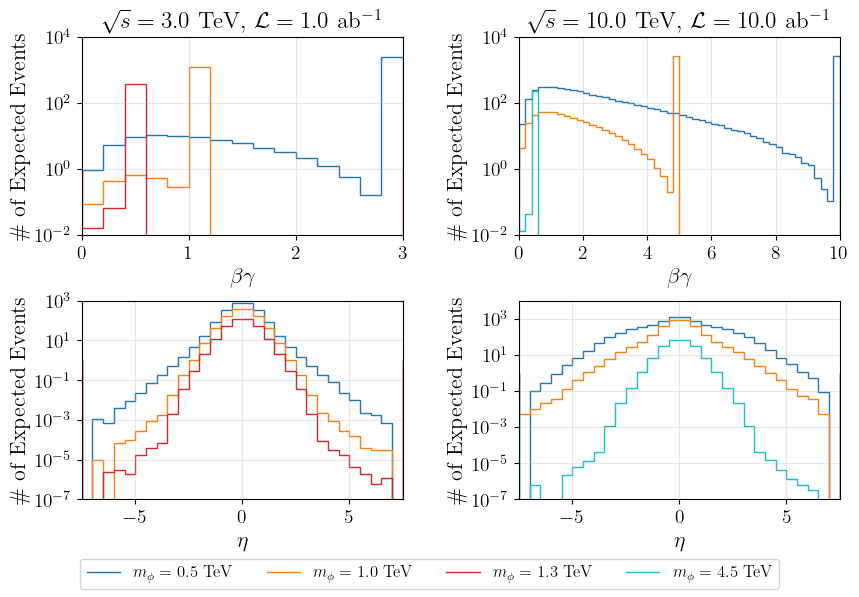

In [44]:
f = make_histograms_xsec_2([rts3_runs, rts10_runs], [rts3_mphis, rts10_mphis], [1e6, 10e6])
f.savefig(FIGDIR*"phiphi_1d_hist.pdf", bbox_inches="tight")
f

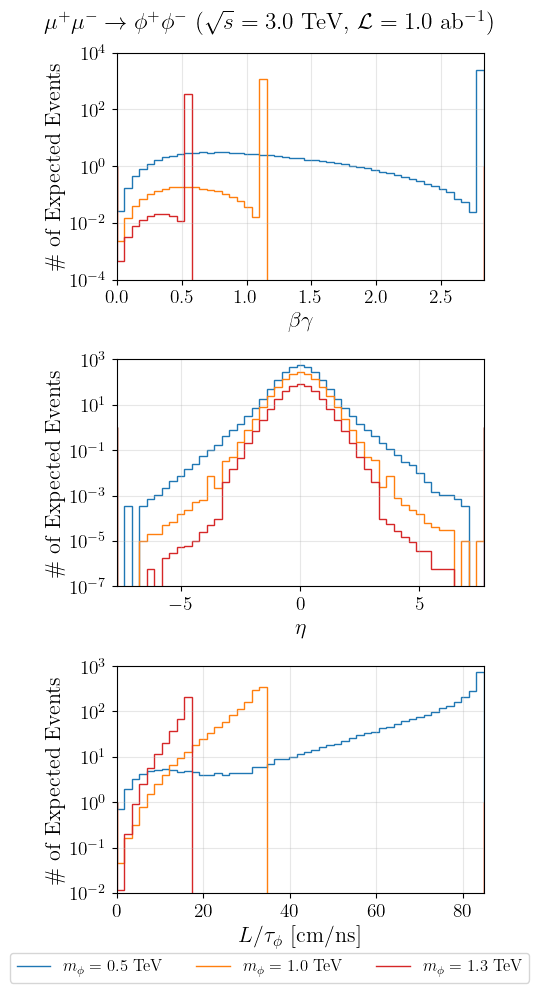

In [98]:
f = make_histograms_xsec(rts3_runs, [.5, 1, 1e-3*rts3_runs.mphis[end-12]], 1e6)
f.savefig(FIGDIR*"expected_hist_rts=3.pdf")
f

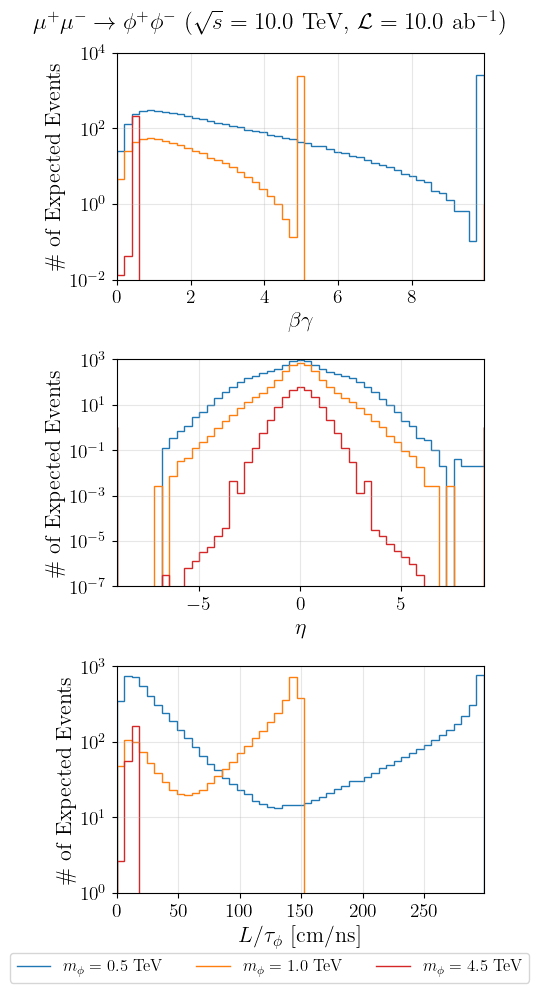

In [99]:
f2 = make_histograms_xsec(rts10_runs, [.5, 1, 1e-3*rts10_runs.mphis[end-5]], 10e6)
f2.savefig(FIGDIR*"expected_hist_rts=10.pdf")
f2

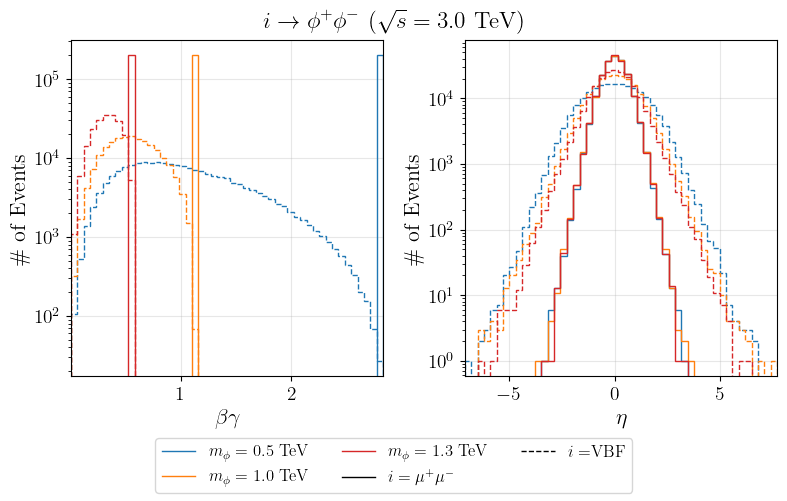

In [77]:
fighist = make_histograms(rts3_runs, [.5, 1, 1e-3*rts3_runs.mphis[end-12]])
fighist.savefig(FIGDIR*"phi_hist_rts=3.pdf")
fighist

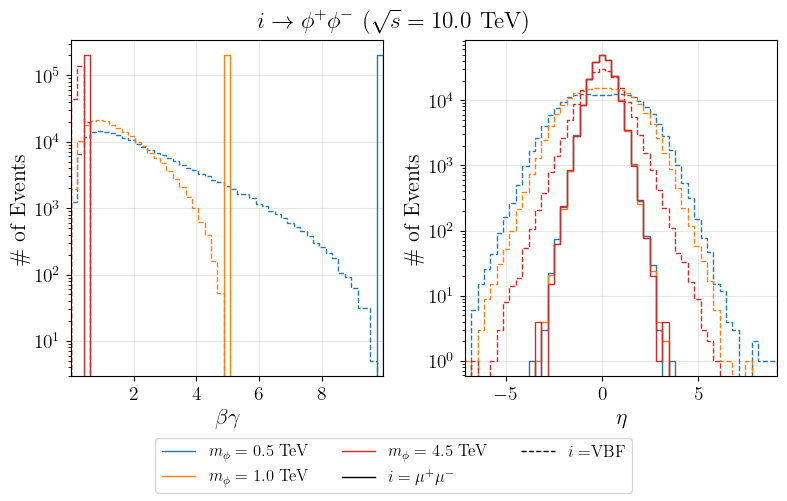

In [78]:
fighist10 = make_histograms(rts10_runs, [.5, 1, 1e-3*rts10_runs.mphis[end-5]])
fighist10.savefig(FIGDIR*"phi_hist_rts=10.pdf")
fighist10

# 2D Histogram $\beta \gamma$ vs $\eta$

In [59]:
function fbin(summary, βγ_range, η_range)
    Nevent = length(summary[1,:])
    βγ_test = βγ_range[1] .<= summary[2,:] .< βγ_range[2]
    η_test = η_range[1] .<= summary[3,:] .< η_range[2]
    res = sum(βγ_test .&& η_test)
    return res / Nevent
end

function bin_data_2d(rts_runs, mphis_tev, lumi; binsize=[[0.05, 0.05, 0.05], 0.5])
    N_mphis = length(mphis_tev)
    N_events = 200000
    mphi_runs = get_run_at_mphi.((rts_runs,), mphis_tev)

    eachmax_βγ = [maximum(mphi_runs[j].mumu_summary[2,:]) for j in 1:N_mphis]
    eachmax2_βγ = [maximum(mphi_runs[j].vv_summary[2,:]) for j in 1:N_mphis]
    βγ_locs = Vector{Vector{Float64}}()

    # eachmax_η = [maximum(abs.(mphi_runs[j].mumu_summary[3,:])) for j in 1:N_mphis]
    # eachmax2_η = [maximum(abs.(mphi_runs[j].vv_summary[3,:])) for j in 1:N_mphis]
    # binmax_η = max(eachmax_η..., eachmax2_η...)
    η_bins = range(-5.5, 5.5; step=binsize[2])
    η_locs = (η_bins[2:end] .+ η_bins[1:end-1])./2

    η_s = [[η_bins[i], η_bins[i+1]] for i in 1:(length(η_bins)-1)]

    res = Vector{Matrix{Float64}}()

    for i in 1:N_mphis
        binmax_βγ = max(eachmax_βγ[i], eachmax2_βγ[i])
        βγ_bins = range(0, ceil(binmax_βγ/binsize[1][i])*binsize[1][i]; 
                    step=binsize[1][i])
        push!(βγ_locs, (βγ_bins[2:end] .+ βγ_bins[1:end-1])./2)

        βγ_s = [[βγ_bins[i], βγ_bins[i+1]] for i in 1:(length(βγ_bins)-1)]

        frac_mumu = fbin.((mphi_runs[i].mumu_summary,), βγ_s, η_s')
        frac_vv = fbin.((mphi_runs[i].vv_summary,), βγ_s, η_s')

        n_mumu = @. mphi_runs[i].mumu_xsec * lumi * frac_mumu
        n_vv = @. mphi_runs[i].vv_xsec * lumi * frac_vv

        push!(res, n_mumu .+ n_vv)
    end
    return (N_events=res, ηs=η_locs, βγs=βγ_locs, rts=rts_runs.rts,
            lumi=lumi, mphis=mphis_tev)
end

function make_2d_hist(binned_data)
    title = L"$\sqrt{s} = %$(1e-3*binned_data.rts)$ TeV, $\mathcal{L} = %$(binned_data.lumi*1e-6)$ ab$^{-1}$"
    labels = Vector{String}()

    for m in binned_data.mphis
        push!(labels, L"$m_\phi = %$(round(m,digits=1))$ TeV")
    end

    xlabels = [L"\beta \gamma", L"\eta"]
    colors = ["tab:blue", "tab:orange", "tab:red"]
    linestyles = ["solid", "dashed"]

    fig, axs = subplots(3, 1, figsize=(5, 10))
    # fig, axs = subplots(1, 3, figsize=(15, 4))

    min_N = 1e-7
    max_N = 1e3

    Lτ_levels = 10 .^ range(log10(.2), log10(to_cm_ns*maximum(maximum.(binned_data.βγs))), 8)
    # formatter(l) = L"10^{ %$(Int(log10(l))) }"
    formatter(l) = L"%$(round(l, sigdigits=2))"

    for (i, a) in enumerate(axs)
        a.set_xlim(-5.5, 5.5)
        a.set_ylim(0, binned_data.βγs[i][end] + 
            (binned_data.βγs[i][2]-binned_data.βγs[i][1])/2)
            
        g = a.pcolormesh(binned_data.ηs, binned_data.βγs[i], 
            binned_data.N_events[i], norm="log", cmap="inferno",
            vmin=min_N, vmax=max_N)

        βγ_max = binned_data.βγs[i][end] + (binned_data.βγs[i][2]-binned_data.βγs[i][1])/2
        βγ_Lτ = range(0, βγ_max, 50)
        ηs_Lτ = range(-5.5, 5.5, 50)
        Lτs = @. to_cm_ns * βγ_Lτ / cosh(ηs_Lτ')
        C = a.contour(ηs_Lτ, βγ_Lτ, Lτs,
                    levels=Lτ_levels, colors="black")

        txts = clabel(C, Lτ_levels, colors="k", fmt=formatter, 
            use_clabeltext=true, inline=true)#, fontsize=16)
        
        for t in txts
            t.set_path_effects([pe.withStroke(linewidth=3, foreground="w")])
        end

        a.set_xlabel(L"\eta")
        a.set_ylabel(L"\beta \gamma")

        a.set_title(labels[i])

        a.grid(alpha=0.3)

        fig.colorbar(g)
    end

    fig.suptitle(title)

    plotclose()
    return fig
end
;

In [12]:
rts3_binned = bin_data_2d(rts3_runs, rts3_mphis, 1e6);

In [40]:
rts10_binned = bin_data_2d(rts10_runs, rts10_mphis, 10e6; binsize=[[0.2, 0.2, 0.05], 0.5]);

In [53]:
f2d_3 = make_2d_hist(rts3_binned)
# f2d_3.savefig(FIGDIR*"2d_betagamma_eta_rts=3.pdf")
f2d_3

UndefVarError: UndefVarError: `rts3_binned` not defined

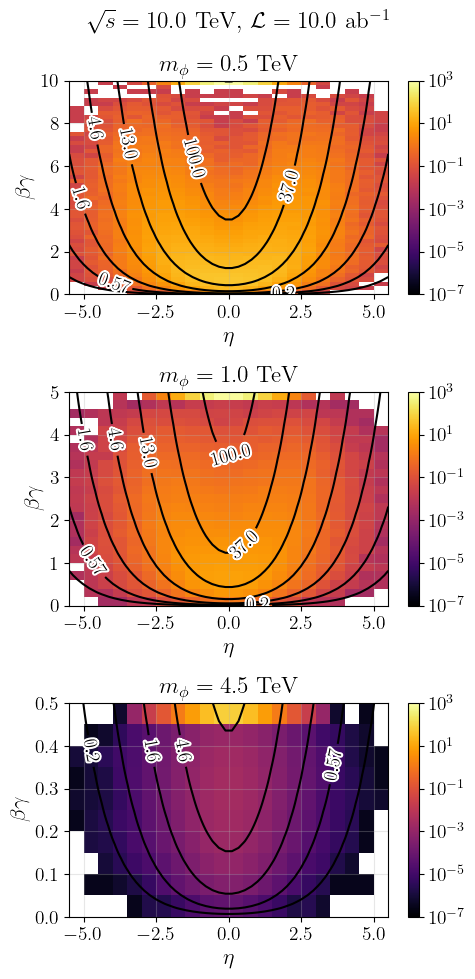

In [60]:
f2d = make_2d_hist(rts10_binned)
f2d.savefig(FIGDIR*"2d_betagamma_eta_rts=10.pdf", bbox_inches="tight")
f2d

# 2D Histogram $L/\tau_\phi$ vs $\eta$

In [17]:
function fbin_2(summary, Lτ_range, η_range)
    Nevent = length(summary[1,:])
    Lτ = summary[2,:] ./ cosh.(summary[3,:])
    Lτ_test = Lτ_range[1] .<= Lτ .< Lτ_range[2]
    η_test = η_range[1] .<= summary[3,:] .< η_range[2]
    res = sum(Lτ_test .&& η_test)
    return res / Nevent
end

function bin_data_2d_Lτ(rts_runs, mphis_tev, lumi; binsize=[[0.05, 0.05, 0.05],.5])
    N_mphis = length(mphis_tev)
    N_events = 200000
    mphi_runs = get_run_at_mphi.((rts_runs,), mphis_tev)

    mumu_Lτ = [mphi_runs[j].mumu_summary[2,:] ./ 
                cosh.(mphi_runs[j].mumu_summary[3,:]) for j in 1:N_mphis]
    vv_Lτ = [mphi_runs[j].vv_summary[2,:] ./ 
            cosh.(mphi_runs[j].vv_summary[3,:]) for j in 1:N_mphis]

    eachmax_βγ = [maximum(mphi_runs[j].mumu_summary[2,:]) for j in 1:N_mphis]
    eachmax2_βγ = [maximum(mphi_runs[j].vv_summary[2,:]) for j in 1:N_mphis]
    Lτ_locs = Vector{Vector{Float64}}()

    # eachmax_η = [maximum(abs.(mphi_runs[j].mumu_summary[3,:])) for j in 1:N_mphis]
    # eachmax2_η = [maximum(abs.(mphi_runs[j].vv_summary[3,:])) for j in 1:N_mphis]
    # binmax_η = max(eachmax_η..., eachmax2_η...)
    η_bins = range(-5.5, 5.5; step=binsize[2])
    η_locs = (η_bins[2:end] .+ η_bins[1:end-1])./2
    η_s = [[η_bins[i], η_bins[i+1]] for i in 1:(length(η_bins)-1)]

    res = Vector{Matrix{Float64}}()

    for i in 1:N_mphis
        binmax_βγ = max(eachmax_βγ[i], eachmax2_βγ[i])
        βγ_bins = range(0, ceil(binmax_βγ/binsize[1][i])*binsize[1][i]; 
                    step=binsize[1][i])
        push!(Lτ_locs, (βγ_bins[2:end] .+ βγ_bins[1:end-1])./2)

        Lτ_s = [[βγ_bins[i], βγ_bins[i+1]] for i in 1:(length(βγ_bins)-1)]

        frac_mumu = fbin_2.((mphi_runs[i].mumu_summary,), Lτ_s, η_s')
        frac_vv = fbin_2.((mphi_runs[i].vv_summary,), Lτ_s, η_s')

        n_mumu = @. mphi_runs[i].mumu_xsec * lumi * frac_mumu
        n_vv = @. mphi_runs[i].vv_xsec * lumi * frac_vv

        push!(res, n_mumu .+ n_vv)
    end
    return (N_events=res, ηs=η_locs, Lτs=Lτ_locs, rts=rts_runs.rts,
            lumi=lumi, mphis=mphis_tev)
end

function make_2d_hist_Lτ(binned_data)
    title = L"$\sqrt{s} = %$(1e-3*binned_data.rts)$ TeV, $\mathcal{L} = %$(binned_data.lumi*1e-6)$ ab$^{-1}$"
    labels = Vector{String}()

    for m in binned_data.mphis
        push!(labels, L"$m_\phi = %$(round(m,digits=1))$ TeV")
    end

    fig, axs = subplots(3, 1, figsize=(5, 10))

    min_N = 1e-7
    max_N = 1e3

    for (i, a) in enumerate(axs)
        Lτ_scaled = ustrip.(unnatural.(u"cm*ns^-1", binned_data.Lτs[i]))

        g = a.pcolormesh(binned_data.ηs, Lτ_scaled, 
            binned_data.N_events[i][:,:], norm="log", 
            vmin=min_N, vmax=max_N, cmap="inferno")

        a.set_xlabel(L"\eta")
        a.set_ylabel(L"$L/\tau_\phi$ [cm/ns]")

        a.set_xlim(-5.5, 5.5)
        a.set_ylim(0, ceil(maximum(Lτ_scaled)))

        a.set_title(labels[i])

        a.grid(alpha=0.3)

        fig.colorbar(g)
    end

    fig.suptitle(title)

    plotclose()
    return fig
end
;

In [18]:
rts3_binned_Lτ = bin_data_2d_Lτ(rts3_runs, rts3_mphis, 1e6);
rts10_binned_Lτ = bin_data_2d_Lτ(rts10_runs, rts10_mphis, 10e6; binsize=[[0.2, 0.2, 0.05], 0.5]);

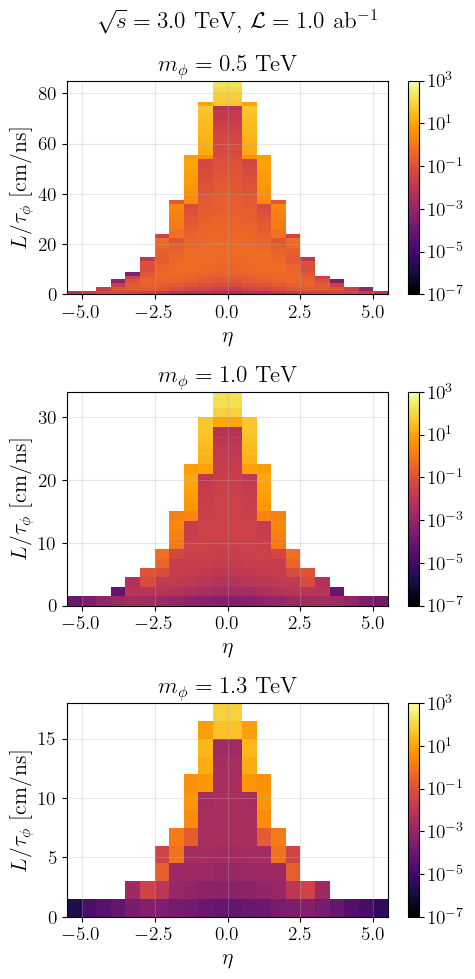

In [19]:
f2d_Lτ_3 = make_2d_hist_Lτ(rts3_binned_Lτ)
f2d_Lτ_3.savefig(FIGDIR*"Ltau_2d_rts=3.pdf")
f2d_Lτ_3

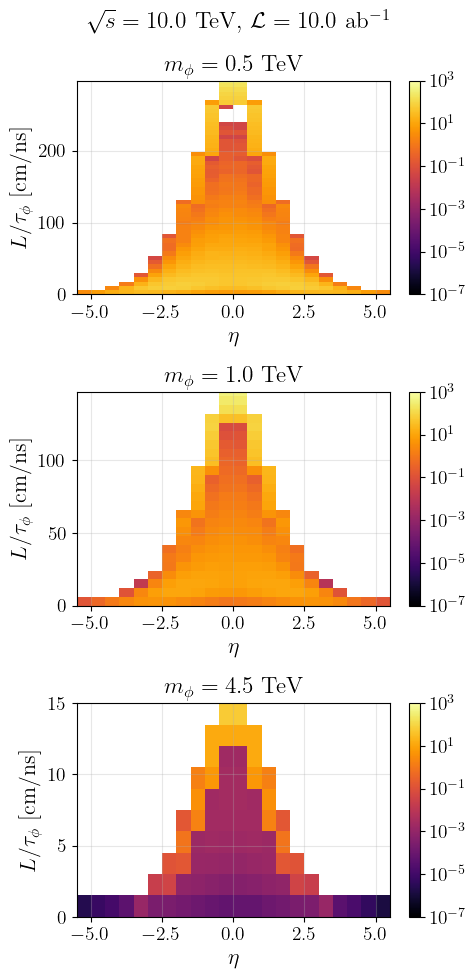

In [20]:
f2d_Lτ_10 = make_2d_hist_Lτ(rts10_binned_Lτ)
f2d_Lτ_10.savefig(FIGDIR*"Ltau_2d_rts=10.pdf")
f2d_Lτ_10

# 2D Histogram $L/\tau_\phi$ vs $\beta \gamma$

In [21]:
function fbin_3(summary, Lτ_range, βγ_range)
    Nevent = length(summary[1,:])
    Lτ = summary[2,:] ./ cosh.(summary[3,:])
    Lτ_test = Lτ_range[1] .<= Lτ .< Lτ_range[2]
    βγ_test = βγ_range[1] .<= summary[2,:] .< βγ_range[2]
    res = sum(Lτ_test .&& βγ_test)
    return res / Nevent
end

function bin_data_2d_βγ_Lτ(rts_runs, mphis_tev, lumi; binsize=[0.05, 0.05, 0.05])
    N_mphis = length(mphis_tev)
    N_events = 200000
    mphi_runs = get_run_at_mphi.((rts_runs,), mphis_tev)

    eachmax_βγ = [maximum(mphi_runs[j].mumu_summary[2,:]) for j in 1:N_mphis]
    eachmax2_βγ = [maximum(mphi_runs[j].vv_summary[2,:]) for j in 1:N_mphis]
    βγ_locs = Vector{Vector{Float64}}()

    res = Vector{Matrix{Float64}}()

    for i in 1:N_mphis
        binmax_βγ = max(eachmax_βγ[i], eachmax2_βγ[i])
        βγ_bins = range(0, ceil(binmax_βγ/binsize[i])*binsize[i]; 
                    step=binsize[i])
        push!(βγ_locs, (βγ_bins[2:end] .+ βγ_bins[1:end-1])./2)

        βγ_s = [[βγ_bins[i], βγ_bins[i+1]] for i in 1:(length(βγ_bins)-1)]

        frac_mumu = fbin_3.((mphi_runs[i].mumu_summary,), βγ_s, βγ_s')
        frac_vv = fbin_3.((mphi_runs[i].vv_summary,), βγ_s, βγ_s')

        n_mumu = @. mphi_runs[i].mumu_xsec * lumi * frac_mumu
        n_vv = @. mphi_runs[i].vv_xsec * lumi * frac_vv

        push!(res, n_mumu .+ n_vv)
    end
    return (N_events=res, βγs=βγ_locs, Lτs=βγ_locs, rts=rts_runs.rts,
            lumi=lumi, mphis=mphis_tev)
end

function make_2d_hist_βγ_Lτ(binned_data)
    title = L"$\sqrt{s} = %$(1e-3*binned_data.rts)$ TeV, $\mathcal{L} = %$(binned_data.lumi*1e-6)$ ab$^{-1}$"
    labels = Vector{String}()

    for m in binned_data.mphis
        push!(labels, L"$m_\phi = %$(round(m,digits=1))$ TeV")
    end

    fig, axs = subplots(3, 1, figsize=(5, 10))

    min_N = 1e-7
    max_N = 1e3

    for (i, a) in enumerate(axs)
        Lτ_scaled = ustrip.(unnatural.(u"cm*ns^-1", binned_data.Lτs[i]))

        g = a.pcolormesh(binned_data.βγs[i], Lτ_scaled, 
            binned_data.N_events[i][:,:], norm="log", 
            vmin=min_N, vmax=max_N, cmap="inferno")

        a.set_xlabel(L"\beta \gamma")
        a.set_ylabel(L"$L/\tau_\phi$ [cm/ns]")

        # a.set_ylim(0, ceil(maximum(Lτ_scaled)))

        a.set_title(labels[i])

        a.grid(alpha=0.3)

        fig.colorbar(g)
    end

    fig.suptitle(title)

    plotclose()
    return fig
end
;

In [22]:
rts3_binned_βγ_Lτ = bin_data_2d_βγ_Lτ(rts3_runs, rts3_mphis, 1e6);
rts10_binned_βγ_Lτ = bin_data_2d_βγ_Lτ(rts10_runs, rts10_mphis, 10e6; binsize=[0.2,0.2,0.05]);

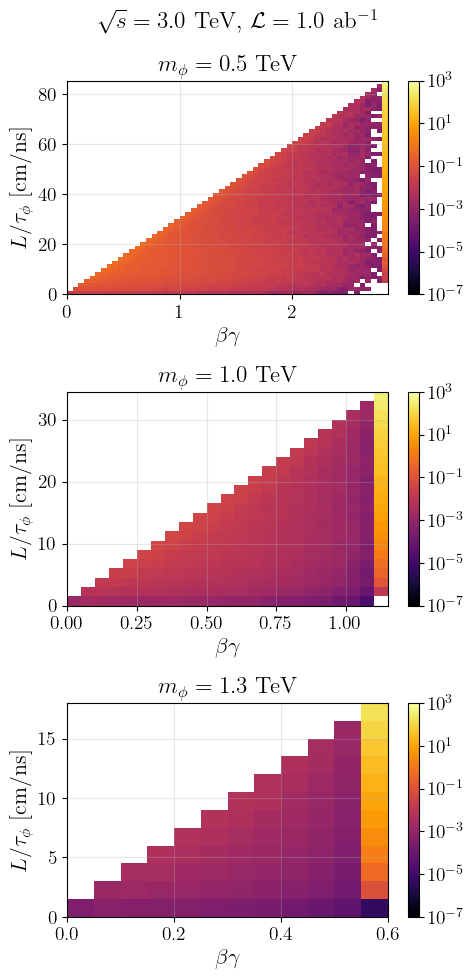

In [23]:
f2d_Lτ_βγ_3 = make_2d_hist_βγ_Lτ(rts3_binned_βγ_Lτ)
f2d_Lτ_βγ_3.savefig(FIGDIR*"Ltau_vs_betagamma_rts=3.pdf")
f2d_Lτ_βγ_3

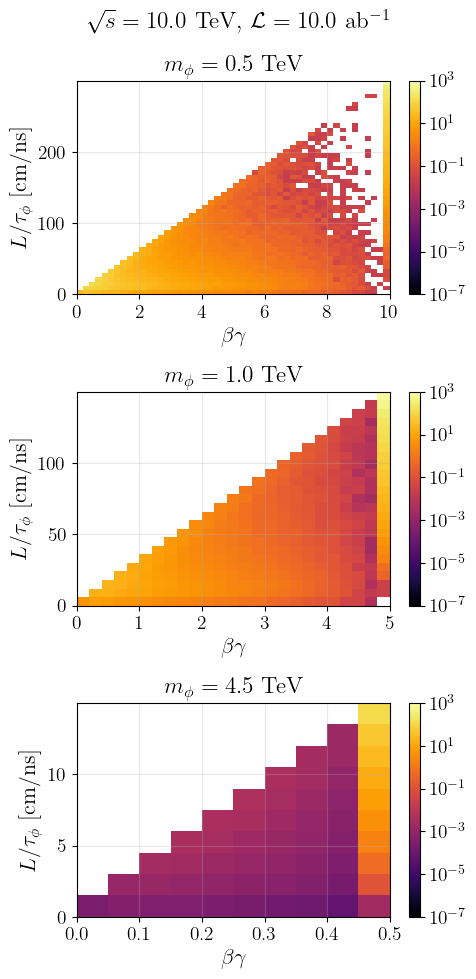

In [24]:
f2d_Lτ_βγ_10 = make_2d_hist_βγ_Lτ(rts10_binned_βγ_Lτ)
f2d_Lτ_βγ_10.savefig(FIGDIR*"Ltau_vs_betagamma_rts=10.pdf")
f2d_Lτ_βγ_10

# Money Plots $m_\phi$ vs $m_\chi$ in different detector subs

In [8]:
import Statistics: mean
function NN_filter(x)
    res = zero(x)

    res[1,1] = mean(vcat(x[2,1], x[1,1], x[1,2]))
    res[1,end] = mean(vcat(x[2,end], x[1,end], x[1,end-1]))
    res[end,1] = mean(vcat(x[end-1,1], x[end,1], x[end,2]))
    res[end,end] = mean(vcat(x[end-1,end], x[end,end], x[end,end-1]))

    for i in 2:(length(x[:,1])-1)
        res[i,1] = mean(vcat(x[i-1:i+1,1], x[i-1:i+1,2]))
        res[i,end] = mean(vcat(x[i-1:i+1,end], x[i-1:i+1,end-1]))
    end

    for j in 2:(length(x[1,:])-1)
        res[1,j] = mean(vcat(x[1,j-1:j+1], x[2,j-1:j+1]))
        res[end,j] = mean(vcat(x[end,j-1:j+1], x[end-1,j-1:j+1]))
    end

    for i in 2:(length(x[:,1])-1)
        for j in 2:(length(x[1,:])-1)
            res[i,j] = mean(vcat(x[i,j-1:j+1], x[i+1,j-1:j+1], x[i-1,j-1:j+1]))
        end
    end

    return res
end
;

In [9]:
function mχ_upper_bound(mφ)
    min(LFDM_Boltz.Mstar_s(mφ/25)/LFDM_Boltz.find_yφf(mφ), mφ)
end

mφ_for_bounds = 10 .^ range(log10(100), 
                                log10(10000/2), 1000)
mχ_upper = mχ_upper_bound.(mφ_for_bounds)
;

In [10]:
using Interpolations
import DelimitedFiles: readdlm

seR_dir = "../data/selectron_bounds/"

se_lo_data = readdlm(seR_dir * "seR_bounds_lower.csv", ',')
se_hi_data = readdlm(seR_dir * "seR_bounds_upper.csv", ',')

se_lo_func = linear_interpolation(se_lo_data[:,1], se_lo_data[:,2] .* 1e-9, extrapolation_bc=Line())
se_hi_func = linear_interpolation(se_hi_data[:,1], se_hi_data[:,2] .* 1e-9, extrapolation_bc=Line())

seR_mphis = 10 .^ range(2, log10(584), 100)

seR_lo_mχ = LFDM_Boltz.mχ_life.(se_lo_func.(seR_mphis), seR_mphis)
seR_hi_mχ = LFDM_Boltz.mχ_life.(se_hi_func.(seR_mphis), seR_mphis)
;

In [18]:
fcut(summary, Lτ_range, η_range) = fbin_2(summary, Lτ_range, η_range)

function events_in_detector_1(summary, xsec, lumi, mphi, tauphi, R_cm, Z_cm)

    L = (summary[2,:] ./ cosh.(summary[3,:]))*tauphi*to_cm_ns
    Lz = (summary[2,:] .* tanh.(abs.(summary[3,:]))) * tauphi * to_cm_ns
    
    return count((R_cm[1] .< L .< R_cm[2]) .&& (Lz .< Z_cm))*xsec*lumi/length(summary[1,:])
end

function events_in_detector_1η(summary, xsec, lumi, mphi, tauphi, R_cm, η)

    L = (summary[2,:] ./ cosh.(summary[3,:]))*tauphi*to_cm_ns
    
    return count((R_cm[1] .< L .< R_cm[2]) .&& (abs.(summary[3,:]) .< η))*xsec*lumi/length(summary[1,:])
end

function events_in_detector(rts_runs, lumi, mchis, R_cm, Z_cm)
    N_events = 200000
    N_mphi = length(rts_runs.mphis)
    N_mchi = length(mchis)
    
    τφs = lifetimes(rts_runs.mphis, mchis).*1e9

    res = zeros(Float64, (N_mphi, N_mchi))

    for i in 1:N_mphi
        for j in 1:N_mchi
            if mchis[j] >= rts_runs.mphis[i]
                res[i,j] = NaN
            else
                # mumu_L_cm = mumu_Lτ[i] .* τφs[i,j] .* 1e9
                # vv_L_cm = vv_Lτ[i] .* τφs[i,j] .* 1e9
                
                # mumu_Lz_cm = @. mumu_Lzτ[i] * τφs[i,j] * 1e9
                # vv_Lz_cm = @. vv_Lzτ[i] * τφs[i,j] * 1e9

                # if i == 22
                #     vv_L_cm_22[:] = vv_L_cm[:]
                #     vv_Lz_cm_22[:] = vv_Lz_cm[:]
                # end

                # # number_mumu = 0
                # # number_vv = 0
                # # for k in 1:N_events
                # #     number_mumu += ((mumu_Lz_cm[k] < Z_cm) && (R_cm[1] <= mumu_L_cm[k] < R_cm[2]))
                # #     number_vv += ((vv_Lz_cm[k] < Z_cm) && (R_cm[1] <= vv_L_cm[k] < R_cm[2]))
                # # end

                # frac_mumu = count((mumu_Lz_cm .< Z_cm) .&& (R_cm[1] .<= mumu_L_cm .< 
                #             R_cm[2])) / N_events
                # frac_vv = count((vv_Lz_cm .< Z_cm) .&& 
                #             (R_cm[1] .<= vv_L_cm .< R_cm[2])) / N_events

                # # frac_mumu = number_mumu / N_events
                # # frac_vv = number_vv / N_events
                
                # fracvv[i,j] = frac_vv
                
                N_exp_mumu = events_in_detector_1(rts_runs.mumu_summaries[i,:,:],
                            rts_runs.mumu_xsecs[i], lumi, rts_runs.mphis[i],
                            τφs[i,j], R_cm, Z_cm)
                N_exp_vv = events_in_detector_1(rts_runs.vv_summaries[i,:,:],
                            rts_runs.vv_xsecs[i], lumi, rts_runs.mphis[i],
                            τφs[i,j], R_cm, Z_cm)

                res[i,j] = N_exp_vv .+ N_exp_mumu
            end
        end
    end
    return res
end

function events_in_detector_η(rts_runs, lumi, mchis, R_cm, η)
    N_events = 200000
    N_mphi = length(rts_runs.mphis)
    N_mchi = length(mchis)
    
    τφs = lifetimes(rts_runs.mphis, mchis).*1e9

    res = zeros(Float64, (N_mphi, N_mchi))

    for i in 1:N_mphi
        for j in 1:N_mchi
            if mchis[j] >= rts_runs.mphis[i]
                res[i,j] = NaN
            else
                N_exp_mumu = events_in_detector_1η(rts_runs.mumu_summaries[i,:,:],
                            rts_runs.mumu_xsecs[i], lumi, rts_runs.mphis[i],
                            τφs[i,j], R_cm, η)
                N_exp_vv = events_in_detector_1η(rts_runs.vv_summaries[i,:,:],
                            rts_runs.vv_xsecs[i], lumi, rts_runs.mphis[i],
                            τφs[i,j], R_cm, η)

                res[i,j] = N_exp_vv .+ N_exp_mumu
            end
        end
    end
    return res
end

function events_in_detector(rts_runs, lumi, mchis)
    detector_Rs = [[3, 10.4], [12.7, 55.4], [81.9, 148.6], [150, 170.2], 
                    [174, 333], [348.3, 429.0], [446.1, 645.0], [645.0, Inf]]
    detector_Zs = [65, (69.2+48.2)/2, 124.9, 221.0, 221.0, 412.9, 417.9, Inf]

    det_labs = ["in Vertex Detector", "in Inner Tracker", "in Outer Tracker", "in ECAL",
                "in HCAL", "in Solenoid", "in Muon Detector", "Outside"]

    N_exp = zeros(Float64, (length(detector_Rs), length(rts_runs.mphis), 
                    length(mchis)))
    
    for i in 1:(length(detector_Rs)-1)
        N_exp[i,:,:] = events_in_detector(rts_runs, lumi, mchis, detector_Rs[i],
            detector_Zs[i])
    end

    N_exp[end,:,:] = events_in_detector_η(rts_runs, lumi, mchis, 
                        detector_Rs[end], 0.61)

    return (N_exp=N_exp, rts=rts_runs.rts, lumi=lumi, mphis=rts_runs.mphis,
            mchis=mchis, labels=det_labs)
end

function make_money(events_in_detector)
    eid = events_in_detector
    title = L"Number of Expected Events ($\sqrt{s} = %$(1e-3*eid.rts)$ TeV, $\mathcal{L} = %$(eid.lumi*1e-6)$ ab$^{-1}$)"

    fig, axs = subplots(4,2,figsize=(10,12))
    # fig, axs = subplots(2,4,figsize=(18,7))

    mphi_plot = 10 .^ range(log10(eid.mphis[1]), log10(eid.mphis[end]), 100)
    mchi_plot = 10 .^ range(log10(eid.mchis[1]), log10(eid.mchis[end]), 100)

    cmap = mpl.cm.Purples
    bounds = -5.0:2.0:5.0
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend="both")
    
    idx = 1
    for ax in axs
        for a in ax
            # itp = interpolate((eid.mphis, eid.mchis), eid.N_exp[idx,:,:], Gridded(Linear()))
            # etp = extrapolate(itp, 0)
            # q = etp.(mphi_plot, mchi_plot')
            # q[isnan.(q)] .= 0.0
            # q = NN_filter(q)
            q = eid.N_exp[idx,:,:]

            g = a.pcolormesh(eid.mchis, eid.mphis, log10.(q), norm=norm,
                            cmap=cmap)
            # g = a.scatter(eid.mchis' .* ones(length(eid.mphis)),
            #               eid.mphis .* ones(length(eid.mchis))',
            #               c=log10.(q), s=1.0, cmap=cmap, norm=norm)
            # g = a.contourf(eid.mchis, eid.mphis, q, 
            #     norm="log", levels=(10 .^ (-5.0:2.0:5.0)), extend="both",
            #     antialiased=false, cmap="Purples", zorder=1)
            a.fill_betweenx(mφ_for_bounds, mχ_upper, 1e4, color="gainsboro", 
                            zorder=2)

            a.fill_between(eid.mchis, 0, 490, edgecolor="tab:blue", facecolor="none")
            
            a.fill_betweenx(seR_mphis, seR_lo_mχ, seR_hi_mχ, edgecolor="tab:orange",
                            facecolor="none")
            
            formatter(l) = L"10^{ %$(Int(l)) }"
            # clabel(g, (10 .^ (-5.0:5.0)), colors="black", fmt=formatter, use_clabeltext=true, inline=true)

            a.set_xscale("log")
            a.set_yscale("log")
            a.set_xlim(eid.mchis[1], eid.mchis[end])
            a.set_ylim(1e2, eid.rts/2)
            cbar = fig.colorbar(g)
            cbar.ax.set_yticklabels(formatter.(bounds))
            a.set_title("Decays $(eid.labels[idx])")
            a.set_xlabel(L"$m_\chi$ [GeV]")
            a.set_ylabel(L"$m_\phi$ [GeV]")

            idx += 1
        end
    end

    fig.suptitle(title)

    plotclose()

    return fig
end

function make_one_money(events_in_detector, idx)
    eid = events_in_detector
    # title = L"Number of Expected Events ($\sqrt{s} = %$(1e-3*eid.rts)$ TeV, $\mathcal{L} = %$(eid.lumi*1e-6)$ ab$^{-1}$)"

    # fig, axs = subplots(4,2,figsize=(10,12))
    # fig, axs = subplots(2,4,figsize=(18,7))
    fig = figure(figsize=(5*golden_ratio,5))
    a = gca()

    mphi_plot = 10 .^ range(log10(eid.mphis[1]), log10(eid.mphis[end]), 100)
    mchi_plot = 10 .^ range(log10(eid.mchis[1]), log10(eid.mchis[end]), 100)

    cmap = mpl.cm.Purples
    bounds = -5.0:2.0:5.0
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend="both")

    q = eid.N_exp[idx,:,:]

    g = a.pcolormesh(eid.mchis, eid.mphis, log10.(q), norm=norm,
                    cmap=cmap)
    a.fill_betweenx(mφ_for_bounds, mχ_upper, 1e4, color="gainsboro", 
                    zorder=2)

    a.set_xscale("log")
    a.set_yscale("log")
    a.set_xlim(eid.mchis[1], eid.mchis[end])
    a.set_ylim(1e2, eid.rts/2)
    fig.colorbar(g)
    a.set_title("Decays in $(eid.labels[idx])")
    a.set_xlabel(L"$m_\chi$ [GeV]")
    a.set_ylabel(L"$m_\phi$ [GeV]")

    # fig.suptitle(title)

    plotclose()

    return fig
end

function make_money_max(events_in_detector)
    eid = events_in_detector

    cmap = mpl.cm.Purples
    bounds = -5.0:2.0:5.0
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend="both")

    fig = figure(figsize=(8,5))

    q = maximum(eid.N_exp, dims=1)[1,:,:]

    # g = contourf(eid.mchis, eid.mphis, maximum(eid.N_exp, dims=1)[1,:,:], 
    #             norm="log", levels=(10 .^ (0.0:5.0)), extend="both", zorder=1)
    g = pcolormesh(eid.mchis, eid.mphis, log10.(q), norm=norm, cmap=cmap)
    fill_betweenx(mφ_for_bounds, mχ_upper, 5e3, color="gainsboro", zorder=2)

    fill_between(eid.mchis, 0, 490, edgecolor="yellow", facecolor="none")
            
    fill_betweenx(seR_mphis, seR_lo_mχ, seR_hi_mχ, edgecolor="tab:orange",
                    facecolor="none")
                    
    xscale("log")
    yscale("log")
    xlim(eid.mchis[1], eid.mchis[end])
    ylim(1e2, eid.rts/2)

    formatter(l) = L"10^{ %$(Int(l)) }"
    cbar = colorbar(g)
    cbar.ax.set_yticklabels(formatter.(bounds))

    title(L"$\sqrt{s} = %$(1e-3*eid.rts)$ TeV, $\mathcal{L} = %$(eid.lumi*1e-6)$ ab$^{-1}$")
    xlabel(L"$m_\chi$ [GeV]")
    ylabel(L"$m_\phi$ [GeV]")

    plotclose()

    return fig
end
;

In [12]:
mchis = 10 .^ range(-5, log10(3.5e3), 50);
eid3 = events_in_detector(rts3_runs, 1e6, mchis);
eid10 = events_in_detector(rts10_runs, 10e6, mchis);

In [14]:
import DelimitedFiles: writedlm

In [16]:
# for i in 1:8
#     writedlm("Nexp_$(i)_rts=3.csv", eid3.N_exp[i,:,:], ',')
# end
# writedlm("mchis.csv", eid3.mchis, ',')
# writedlm("mphis.csv", eid3.mphis, ',')

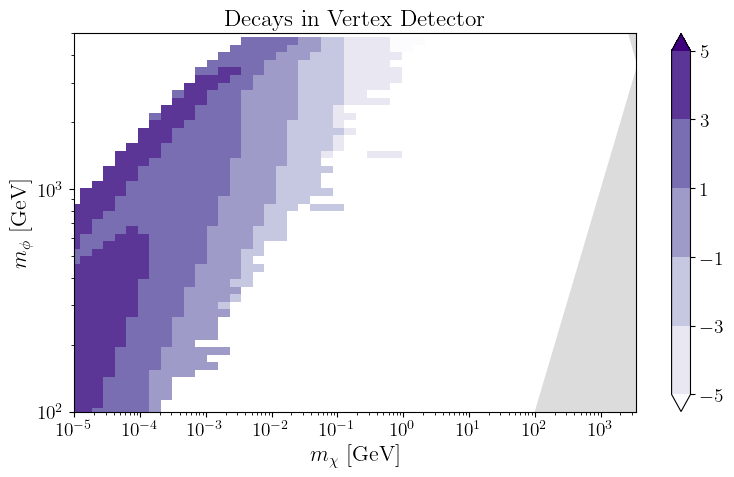

In [23]:
# fig_om = make_one_money(eid10, 1)
# fig_om.savefig(FIGDIR*"vertex_detector_money_rts=10.pdf")
# fig_om

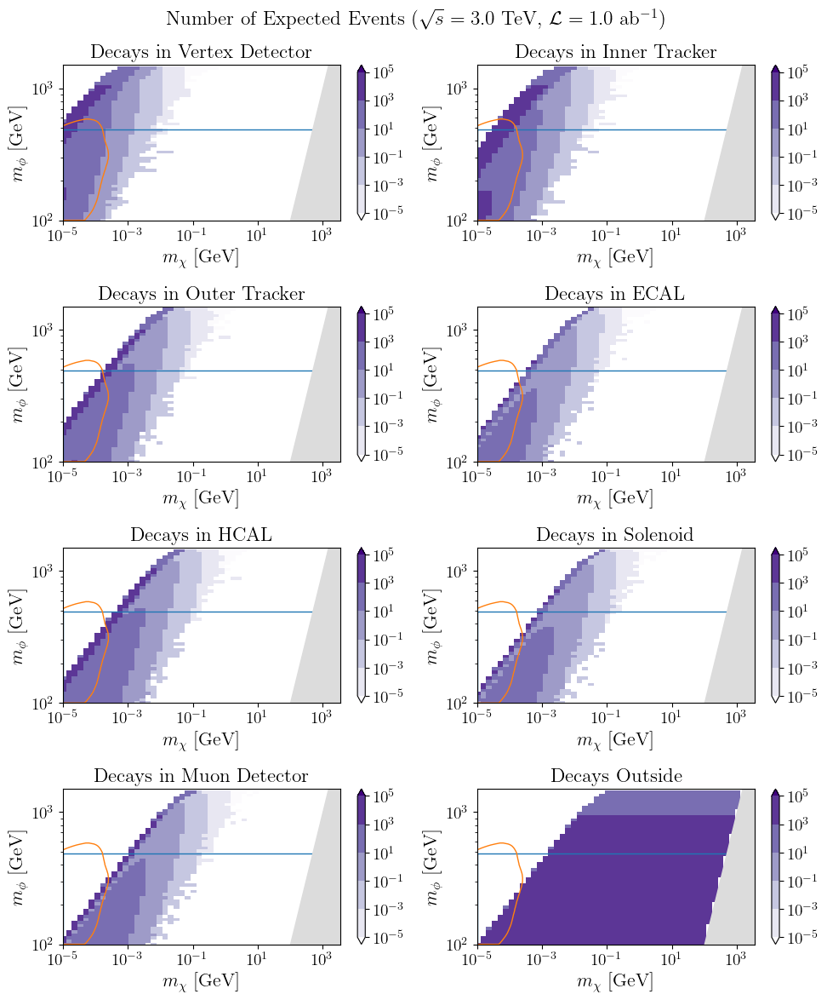

In [14]:
f_money = make_money(eid3)

In [15]:
f_money.savefig(FIGDIR*"decays_mphi_mchi_rts=3.pdf", bbox_inches="tight")

Python: None

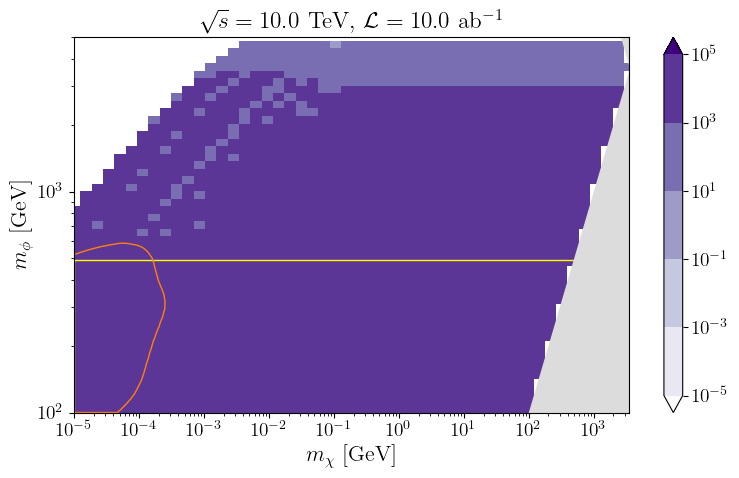

In [21]:
f_mm = make_money_max(eid10)
f_mm.savefig(FIGDIR*"decays_max_rts=10.pdf")
f_mm

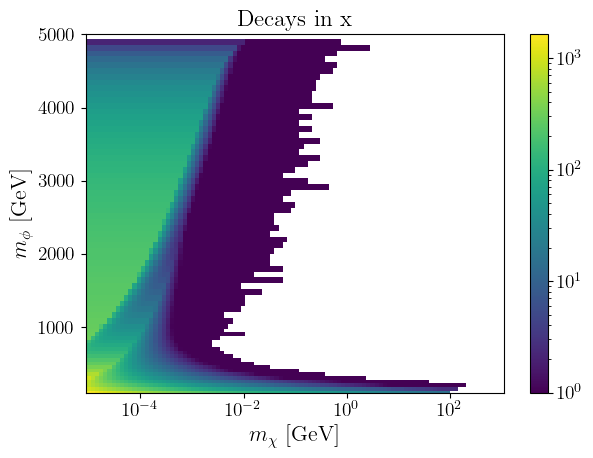

In [27]:
f = figure()
g = pcolormesh(10 .^ range(-5, 3, 100), rts10_runs.mphis, tes, norm="log",
        vmin=1)
xscale("log")
# yscale("log")
ylim(1e2, 5e3)
colorbar(g)
title("Decays in x")
xlabel(L"$m_\chi$ [GeV]")
ylabel(L"$m_\phi$ [GeV]")
plotclose()
f

# MIP Comparison

In [25]:
function Δt_mip(summary, R_cm)
    return @. R_cm*cosh(summary[3,:])*(1/summary[1,:] - 1)/to_cm_ns
end

function make_Δt_hist(rts_runs, mphis_tev, lumi; R_cm=446.1, log_binsize=.1)
    N_mphis = length(mphis_tev)
    N_events = 200000

    labels = Vector{String}()

    for m in mphis_tev
        push!(labels, L"$m_\phi = %$(round(m,digits=1))$ TeV")
    end

    mphi_runs = get_run_at_mphi.((rts_runs,), mphis_tev)

    colors = ["tab:blue", "tab:orange", "tab:red"]
    linestyles = ["solid", "dashed"]

    fig = figure(figsize=(5,5))
    ax = gca()

    mumu_Δt = [Δt_mip(rts_runs.mumu_summaries[i,:,:], R_cm) for i in 1:N_mphis]
    vv_Δt = [Δt_mip(rts_runs.vv_summaries[i,:,:], R_cm) for i in 1:N_mphis]
    
    eachmin_Δt = [minimum(mumu_Δt[j]) for j in 1:N_mphis]
    eachmin2_Δt = [minimum(vv_Δt[j]) for j in 1:N_mphis]
    binmin_Δt = min(eachmin_Δt..., eachmin2_Δt...)

    eachmax_Δt = [maximum(mumu_Δt[j]) for j in 1:N_mphis]
    eachmax2_Δt = [maximum(vv_Δt[j]) for j in 1:N_mphis]
    binmax_Δt = max(eachmax_Δt..., eachmax2_Δt...)

    min_Δt = floor(log10(binmin_Δt)/log_binsize)*log_binsize
    max_Δt = ceil(log10(binmax_Δt)/log_binsize)*log_binsize

    Δt_bins = 10 .^ range(min_Δt, max_Δt; step=log_binsize)

    minN = zeros(Float64, N_mphis)
    maxN = zeros(Float64, N_mphis)

    for j in 1:N_mphis
        mumu_binned = bin_data(mumu_Δt[j], Δt_bins)
        mumu_scaled = @. mphi_runs[j].mumu_xsec*lumi*mumu_binned / N_events

        vv_binned = bin_data(vv_Δt[j], Δt_bins)
        vv_scaled = @. mphi_runs[j].vv_xsec*lumi*vv_binned / N_events

        N_expected = mumu_scaled .+ vv_scaled

        minN[j] = minimum(N_expected[N_expected .> 0])
        maxN[j] = maximum(N_expected)

        @. N_expected = N_expected + (N_expected == 0)*1e-50

        ax.stairs(log10.(N_expected), edges=log10.(Δt_bins), 
            color=colors[j], linestyle=linestyles[1], label=labels[j])
    end

    ylim_min = floor(log10(minimum(minN)))
    ylim_max = ceil(log10(maximum(maxN)))

    # a.set_yscale("log")

    ax.set_xlabel(L"$\Delta t$ [ns]")
    ax.set_ylabel("\\# of Expected Events")

    ax.grid(alpha=0.3)

    ax.set_xlim((min_Δt, max_Δt))
    ax.set_ylim((ylim_min, ylim_max))

    x_extent = log10(binmax_Δt) - log10(binmin_Δt)
    y_extent = ylim_max - ylim_min

    if y_extent <= 5
        yticks = ylim_min:ylim_max
    else
        yticks = ylim_min:2:ylim_max
    end
    yticklabels = [L"10^{%$(round(Int,x))}" for x in yticks]
    ax.set_yticks(yticks, yticklabels)

    xticks = ceil(log10(binmin_Δt)):floor(log10(binmax_Δt))
    xticklabels = [L"10^{%$(round(Int,x))}" for x in xticks]
    ax.set_xticks(xticks, xticklabels)

    ax.set_aspect(x_extent / (y_extent*golden_ratio), adjustable="box")

    ax.legend(fontsize=12)

    title(L"$\sqrt{s} = %$(1e-3*rts_runs.rts)$ TeV, $\mathcal{L} = %$(lumi*1e-6)$ ab$^{-1}$")

    tight_layout(rect=(0, 0, 1, 1))

    plotclose()
    return fig
end
;

In [142]:
minimum(rts10_runs.mumu_summaries[:,1,:])

0.19899748741964293

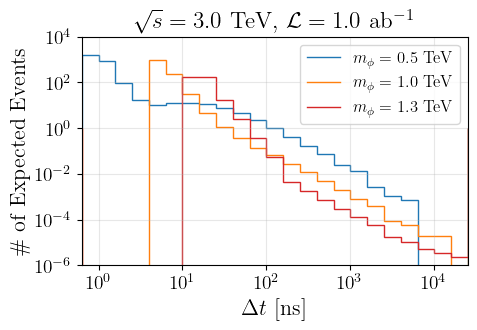

In [27]:
f_Δt = make_Δt_hist(rts3_runs, rts3_mphis, 1e6; log_binsize=0.2)
f_Δt.savefig(FIGDIR*"delta_t_mip_rts=3.pdf", bbox_inches="tight")
f_Δt